In [4]:
# lets import required python libraries
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from moviepy.editor import VideoFileClip
from IPython.display import HTML
%matplotlib inline

In [5]:
# define a function that will return calibration matrix and distortion coefficients.
def get_cam_calib():
    nx = 9
    ny = 6
    objpoints = []
    imgpoints = []
    objp = np.zeros((ny*nx,3), np.float32)
    objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)

    images = glob.glob('camera_cal/calibration*.jpg')

    for fname in images:
        img = mpimg.imread(fname)
        h,w = img.shape[:2]
        gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
        ret, corners = cv2.findChessboardCorners(gray, (nx,ny),None)
        print(ret)
        if ret == True:
            imgpoints.append(corners)
            objpoints.append(objp)

    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape, None, None)
    return mtx, dist, h, w

In [6]:
# call this function to get those camera stuff
mtx, dist, h, w = get_cam_calib()

False
True
True
True
True
True
True
True
True
True
True
True
True
True
False
False
True
True
True
True


In [7]:
# define a function to un-distort the camera lense effect
def cam_correction(img):
    img_cc = cv2.undistort(img, mtx, dist, None, mtx)
    return img_cc

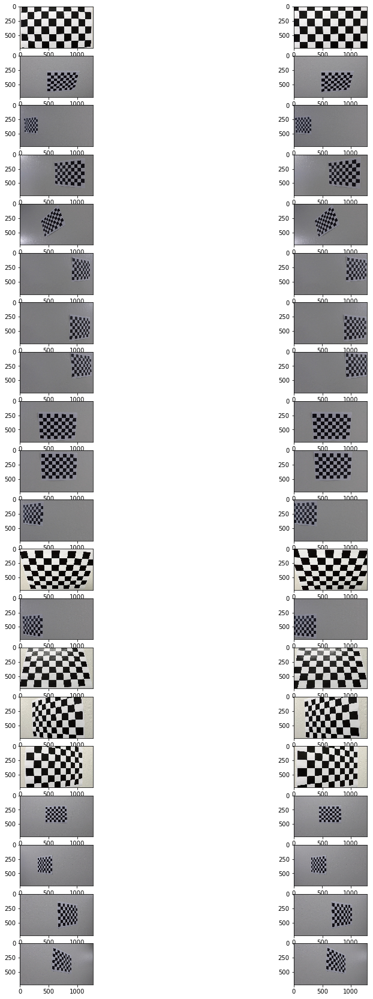

In [8]:
# undistort each image and show distorted(left) and undistorted(right) side by side
images = glob.glob('camera_cal/calibration*.jpg')
plt.subplots(len(images),2, figsize=(15,30))
#plt.subplots_adjust(hspace = .01, wspace=.01)
i=0
for fname in images:
    img = mpimg.imread(fname)
    plt.subplot(len(images),2,2*i+1)
    plt.imshow(img, cmap='gray')
    img_cc = cam_correction(img)
    plt.subplot(len(images),2,2*i+2)
    plt.imshow(img_cc, cmap='gray')
    i = i+1

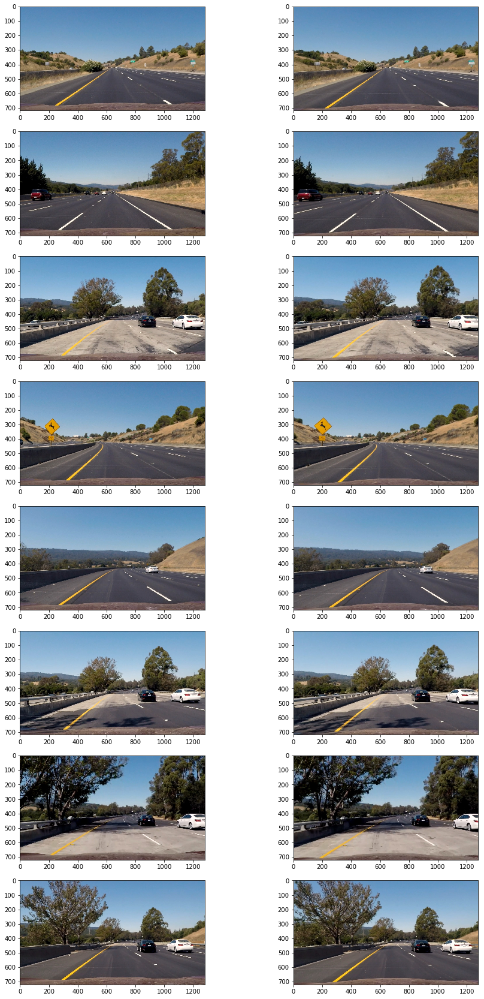

In [9]:
# do the same thing as above for all test images
images = glob.glob('test_images/*.jpg')
plt.subplots(len(images),2, figsize=(15,30))
#plt.subplots_adjust(hspace = .01, wspace=.01)
i=0
for fname in images:
    img = mpimg.imread(fname)
    plt.subplot(len(images),2,2*i+1)
    plt.imshow(img, cmap='gray')
    img_cc = cam_correction(img)
    plt.subplot(len(images),2,2*i+2)
    plt.imshow(img_cc, cmap='gray')
    i = i+1

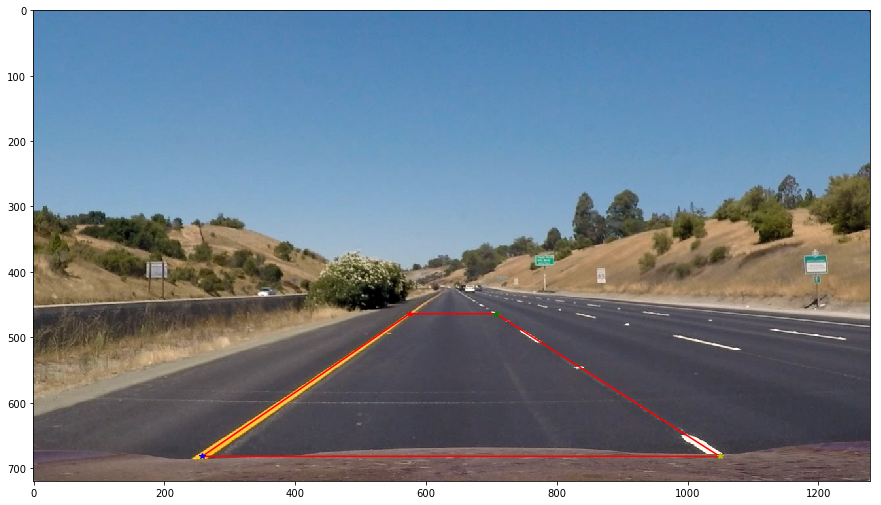

In [10]:
# read an image that contains straight lane lines, to get perspective transform matrix (approximately only)
img = mpimg.imread('test_images/straight_lines1.jpg')
plt.figure(figsize=(15,30))
plt.imshow(img)
# 4 source points on image in clockwise direction starting from top-left corner
#src = np.float32([(582,458),(698,458),(1038,675),(266,675)])
src = np.float32([(575,464),(707,464),(1049,682),(258,682)])
x = [src[0][0],src[1][0],src[2][0],src[3][0],src[0][0]]
y = [src[0][1],src[1][1],src[2][1],src[3][1],src[0][1]]
plt.plot(x, y, color='red')
plt.plot(src[0][0],src[0][1],'r*')
plt.plot(src[1][0],src[1][1],'g*')
plt.plot(src[2][0],src[2][1],'y*')
plt.plot(src[3][0],src[3][1],'b*')

In [11]:
# 4 destination points on image in clockwise direction starting from top-left corner 
dst = np.float32([(450,0),(w-450,0),(w-450,h),(450,h)])

In [12]:
# define a function to get perpective transformation and inverse matrix
def get_pt_mat():
    #src = np.float32([(582,458),(698,458),(1038,675),(266,675)])
    src = np.float32([(575,464),(707,464),(1049,682),(258,682)])
    dst = np.float32([(450,0),(w-450,0),(w-450,h),(450,h)])
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    return M, Minv

In [13]:
# get those matrices
M, Minv = get_pt_mat()

In [14]:
# define a function to perspective transform an image
def perspTrans(img):
    img_pt = cv2.warpPerspective(img, M, (w,h), flags=cv2.INTER_LINEAR)
    return img_pt

In [15]:
# define a function to inverse perspective transform an image
def perspTransInverse(img_pt):
    img = cv2.warpPerspective(img_pt, Minv, (w,h), flags=cv2.INTER_LINEAR)
    return img

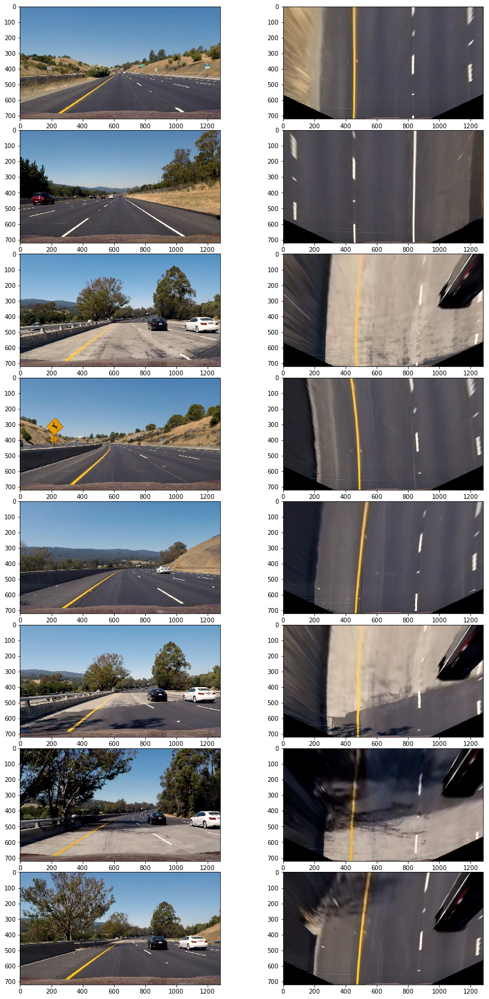

In [16]:
# show how the perspective transformation works on all images
images = glob.glob('test_images/*.jpg')
plt.subplots(len(images),2, figsize=(15,30))
plt.subplots_adjust(hspace = .1, wspace=.1)
i=0
for fname in images:
    img = mpimg.imread(fname)
    plt.subplot(len(images),2,2*i+1)
    plt.imshow(img, cmap='gray')
    img_pt = perspTrans(img)
    plt.subplot(len(images),2,2*i+2)
    plt.imshow(img_pt, cmap='gray')
    i = i+1

In [17]:
# define a function to get binary thresholded image of lane lines only(approximately)
def L_bin(img, thresh=(220, 255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    hls_l = hls[:,:,1]
    hls_l = hls_l*(255/np.max(hls_l))
    binary_output = np.zeros_like(hls_l)
    binary_output[(hls_l > thresh[0]) & (hls_l <= thresh[1])] = 1
    return binary_output

# define another function to get binary thresholded image of lane lines only(approximately)
def Lab_bin(img, thresh=(190,255)):
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2Lab)
    lab_b = lab[:,:,2]
    if np.max(lab_b) > 175:
        lab_b = lab_b*(255/np.max(lab_b))
    binary_output = np.zeros_like(lab_b)
    binary_output[((lab_b > thresh[0]) & (lab_b <= thresh[1]))] = 1
    return binary_output

# define the first function (process_1_*) in pipeline to get combined binary thresholded image of lane lines.
def process_1_cc_pt_thr(img):
    img_cc = cam_correction(img)
    img_cc_pt = perspTrans(img_cc)
    img_cc_pt_L_bin = L_bin(img_cc_pt)
    img_cc_pt_Lab_bin = Lab_bin(img_cc_pt)
    img_cc_pt_thr = np.zeros_like(img_cc_pt_Lab_bin)
    img_cc_pt_thr[(img_cc_pt_L_bin == 1) | (img_cc_pt_Lab_bin == 1)] = 1
    return img_cc_pt_thr

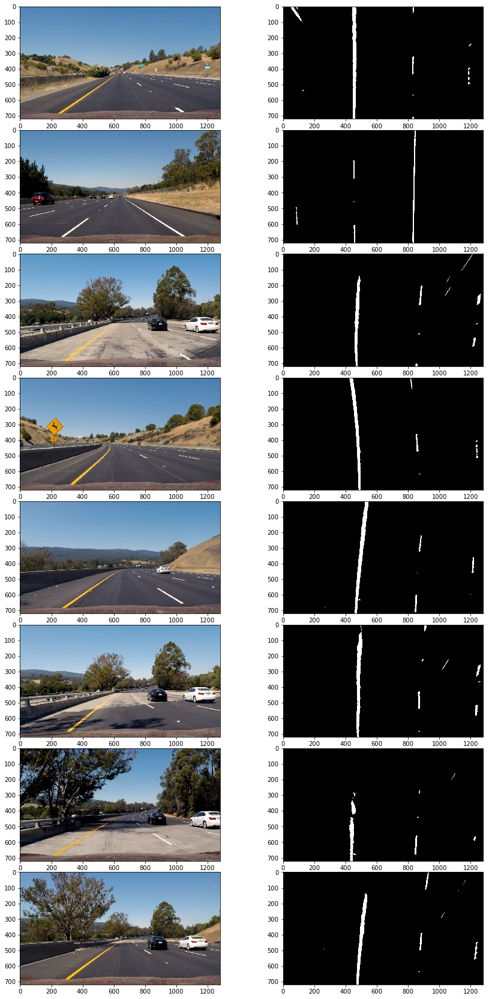

In [18]:
# show all images with corresponding combined binary thresholded images.
images = glob.glob('test_images/*.jpg')
plt.subplots(len(images),2, figsize=(15,30))
plt.subplots_adjust(hspace = .1, wspace=.1)
i=0
for fname in images:
    img = mpimg.imread(fname)
    plt.subplot(len(images),2,2*i+1)
    plt.imshow(img, cmap='gray')
    img_bin = process_1_cc_pt_thr(img)
    plt.subplot(len(images),2,2*i+2)
    plt.imshow(img_bin, cmap='gray')
    i = i+1

In [19]:
# This function is 2nd in the pipeline (process_2_*) to find lane lines fitting coefficients on cam-calibrated, 
# warped and thresholded-binary image.
# This function takes as input a binary image as shown above and returns left and right 2nd order curve 
# fitting coefficients. It also returns indices on bin image that corresponds to only lane lines makring.

def process_2_line_fit_current(img_bin):
    histogram = np.sum(img_bin[img_bin.shape[0]//2:,:], axis=0)
    midpoint = np.int(histogram.shape[0]//2)
    quarter_point = np.int(midpoint//2)
    left_lane_x_base = np.argmax(histogram[quarter_point:midpoint]) + quarter_point
    right_lane_x_base = np.argmax(histogram[midpoint:(midpoint+quarter_point)]) + midpoint
    n_windows = 10
    window_height = np.int(img_bin.shape[0]/n_windows)
    nonzero_pixels = img_bin.nonzero()
    nonzero_pixels_y = np.array(nonzero_pixels[0])
    nonzero_pixels_x = np.array(nonzero_pixels[1])
    left_x_current = left_lane_x_base
    right_x_current = right_lane_x_base
    margin = 80
    minpix = 40
    left_lane_inds = []
    right_lane_inds = []

    for window in range(n_windows):
        win_y_low = img_bin.shape[0] - (window+1)*window_height
        win_y_high = img_bin.shape[0] - window*window_height
        win_x_left_low = left_x_current - margin
        win_x_left_high = left_x_current + margin
        win_x_right_low = right_x_current - margin
        win_x_right_high = right_x_current + margin
        good_left_inds = ((nonzero_pixels_y >= win_y_low) & (nonzero_pixels_y <  win_y_high) & (nonzero_pixels_x >= win_x_left_low) & (nonzero_pixels_x <  win_x_left_high)).nonzero()[0]
        good_right_inds = ((nonzero_pixels_y >= win_y_low) & (nonzero_pixels_y <  win_y_high) & (nonzero_pixels_x >= win_x_right_low) & (nonzero_pixels_x < win_x_right_high)).nonzero()[0]
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        if len(good_left_inds) > minpix:
            left_x_current = np.int(np.mean(nonzero_pixels_x[good_left_inds]))
        if len(good_right_inds) > minpix:        
            right_x_current = np.int(np.mean(nonzero_pixels_x[good_right_inds]))

    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
    left_x = nonzero_pixels_x[left_lane_inds]
    left_y = nonzero_pixels_y[left_lane_inds] 
    right_x = nonzero_pixels_x[right_lane_inds]
    right_y = nonzero_pixels_y[right_lane_inds] 
    left_fit_coef, right_fit_coef = (None, None)

    if len(left_x) != 0:
        left_fit_coef = np.polyfit(left_y, left_x, 2)
    if len(right_x) != 0:
        right_fit_coef = np.polyfit(right_y, right_x, 2)
       
    return left_fit_coef, right_fit_coef, left_lane_inds, right_lane_inds

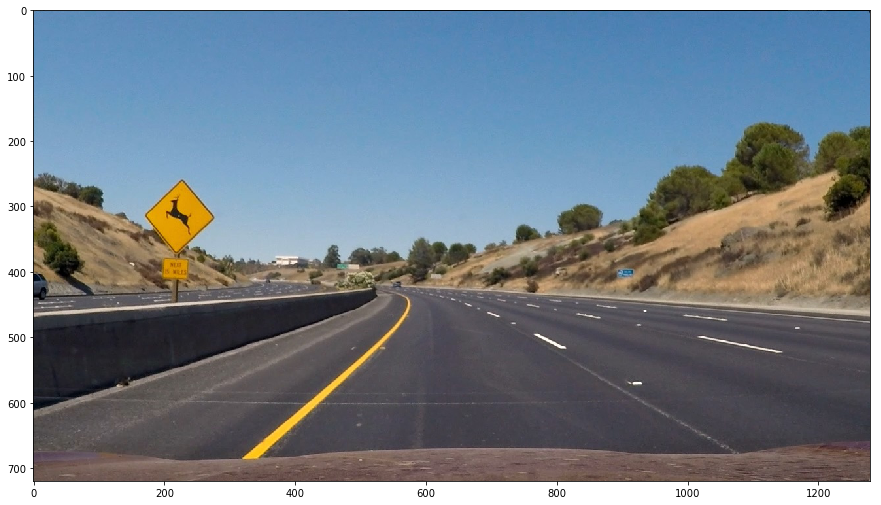

In [20]:
# lets show an image with lane lines on them
img = mpimg.imread('test_images/test2.jpg')
plt.figure(figsize=(15,30))
plt.imshow(img)

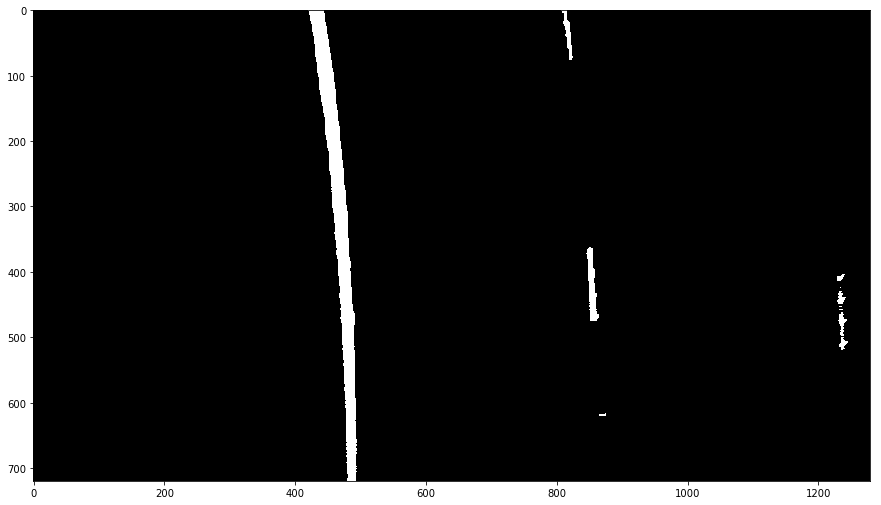

In [21]:
# let's show its cam-calibrated, perspective-warped and binary-thresholded version
img_cc_pt_thr = process_1_cc_pt_thr(img)
plt.figure(figsize=(15,30))
plt.imshow(img_cc_pt_thr, cmap='gray')

In [22]:
# lets find 2nd order curve fitting coefficients for both right and left lane , and indices also
left_fit_coef, right_fit_coef, left_lane_inds, right_lane_inds = process_2_line_fit_current(img_cc_pt_thr)

In [23]:
print(left_fit_coef)

[ -1.04395358e-04   1.48485536e-01   4.33557213e+02]


In [24]:
print(right_fit_coef)

[ -3.79430579e-05   1.12605752e-01   8.13661298e+02]


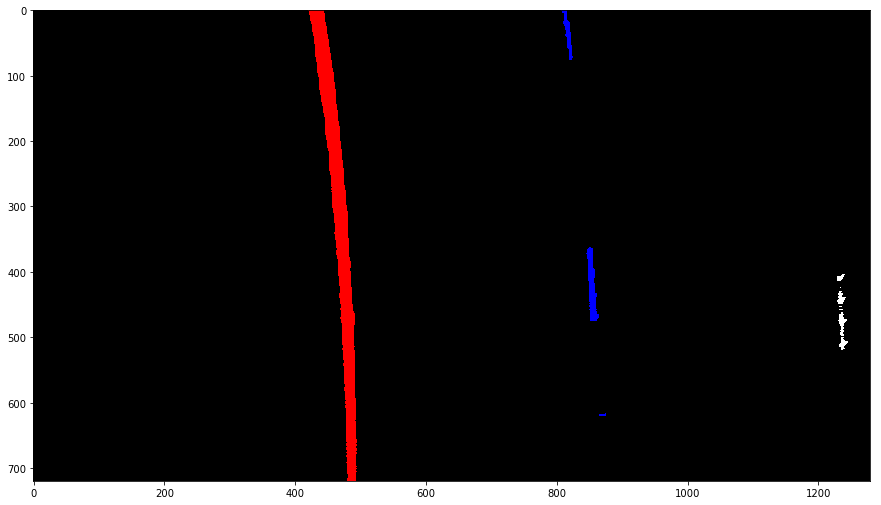

In [25]:
# let's define a 3-channel color image and mark on it left lane with red color 
# and right lane with blue color using indices found in the above function

img_out = np.uint8(np.dstack((img_cc_pt_thr, img_cc_pt_thr, img_cc_pt_thr))*255)
nonzero = img_cc_pt_thr.nonzero()
nonzero_y = np.array(nonzero[0])
nonzero_x = np.array(nonzero[1])
img_out[nonzero_y[left_lane_inds], nonzero_x[left_lane_inds]] = [255, 0, 0]
img_out[nonzero_y[right_lane_inds], nonzero_x[right_lane_inds]] = [0, 0, 255]
plt.figure(figsize=(15,30))
plt.imshow(img_out)

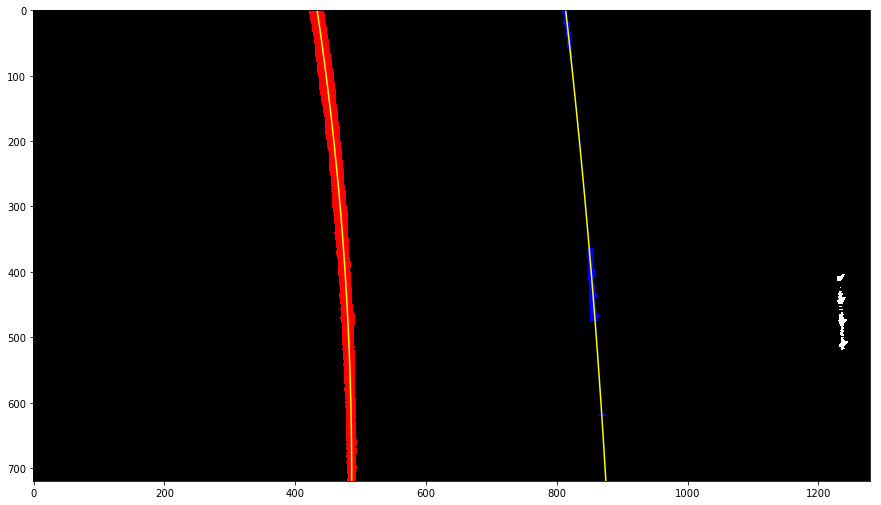

In [26]:
# let's draw lane curve, fitted using 2nd order polynomial using a yellow color

plot_y       = np.linspace(0, h-1, h )
plot_left_x  = left_fit_coef[0] * plot_y**2 + left_fit_coef[1] * plot_y + left_fit_coef[2]
plot_right_x = right_fit_coef[0]* plot_y**2 + right_fit_coef[1]* plot_y + right_fit_coef[2]
plt.figure(figsize=(15,30))
plt.imshow(img_out)
plt.plot(plot_left_x, plot_y, color='yellow')
plt.plot(plot_right_x, plot_y, color='yellow')

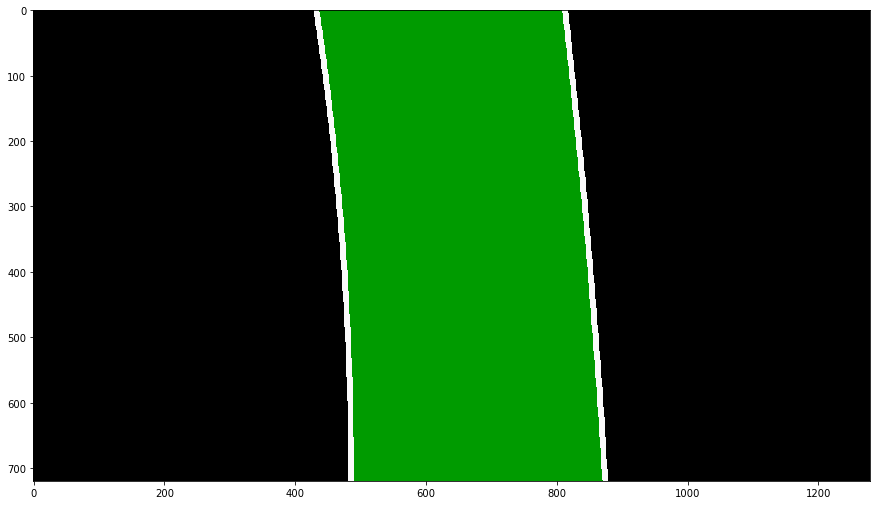

In [27]:
# let's fill the area between two yellow lane curve marked with green carpet

pts_left  = np.array([np.transpose(np.vstack([plot_left_x, plot_y]))])
pts_right = np.array([np.flipud(np.transpose(np.vstack([plot_right_x, plot_y])))])
pts       = np.hstack((pts_left, pts_right))
img_lane_pt = np.zeros_like(img_out)
cv2.fillPoly(img_lane_pt, np.int_([pts]), (0,155, 0))
cv2.polylines(img_lane_pt, np.int32([pts_left]),  isClosed=False, color=(250,250,250), thickness=7)
cv2.polylines(img_lane_pt, np.int32([pts_right]), isClosed=False, color=(250,250,250), thickness=7)
plt.figure(figsize=(15,30))
plt.imshow(img_lane_pt)

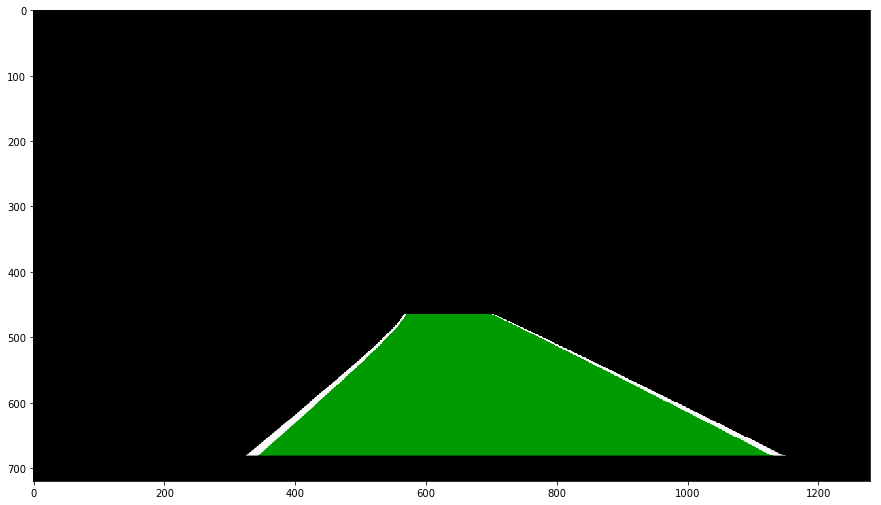

In [28]:
# let's do the inverse of perspective warping so that we can overlap and merge the green carpet on real life road image

img_lane = perspTransInverse(img_lane_pt)
plt.figure(figsize=(15,30))
plt.imshow(img_lane)

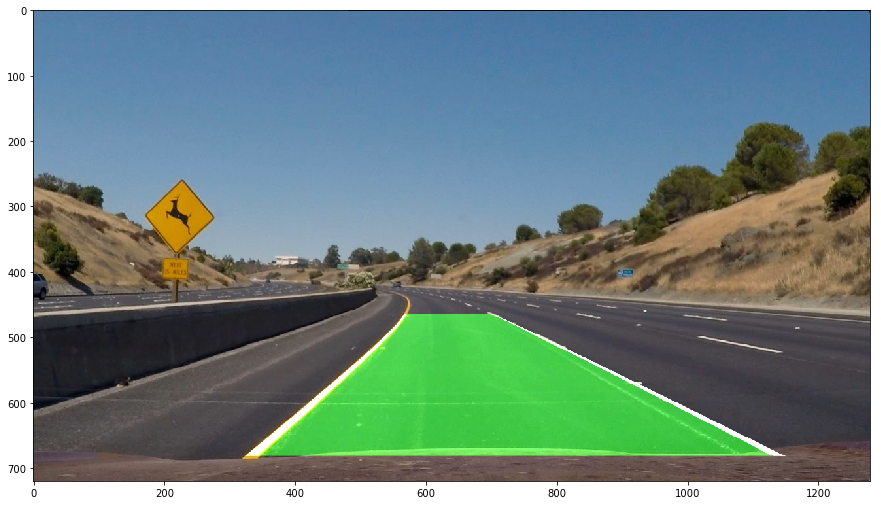

In [29]:
# lets draw green carpet on the actual road image.

alpha = 0.9
beta  = 0.9
gamma = 1
img_lane_imposed = cv2.addWeighted(img, alpha, img_lane, beta, gamma)
plt.figure(figsize=(15,30))
plt.imshow(img_lane_imposed)

In [30]:
# Define a function (process_2_*) to find the lane fitting coefficients on an input image using help 
# from the previous frame's lane marking coefficients

def process_2_line_fit_prev(img_bin, left_fit_prev, right_fit_prev):
    nonzero   = img_bin.nonzero()
    nonzero_y = np.array(nonzero[0])
    nonzero_x = np.array(nonzero[1])
    margin = 80
    left_lane_inds = ((nonzero_x > (left_fit_prev[0]*(nonzero_y**2) + left_fit_prev[1]*nonzero_y + left_fit_prev[2] - margin)) & (nonzero_x < (left_fit_prev[0]*(nonzero_y**2) + left_fit_prev[1]*nonzero_y + left_fit_prev[2] + margin)))
    right_lane_inds = ((nonzero_x > (right_fit_prev[0]*(nonzero_y**2) + right_fit_prev[1]*nonzero_y + right_fit_prev[2] - margin)) & (nonzero_x < (right_fit_prev[0]*(nonzero_y**2) + right_fit_prev[1]*nonzero_y + right_fit_prev[2] + margin)))

    left_x  = nonzero_x[left_lane_inds]
    left_y  = nonzero_y[left_lane_inds] 
    right_x = nonzero_x[right_lane_inds]
    right_y = nonzero_y[right_lane_inds]
    
    left_fit_coef_current  = None
    right_fit_coef_current = None
    if len(left_x) != 0:
        left_fit_coef_current = np.polyfit(left_y, left_x, 2)
    if len(right_x) != 0:
        right_fit_coef_current = np.polyfit(right_y, right_x, 2)

    return left_fit_coef_current, right_fit_coef_current, left_lane_inds, right_lane_inds

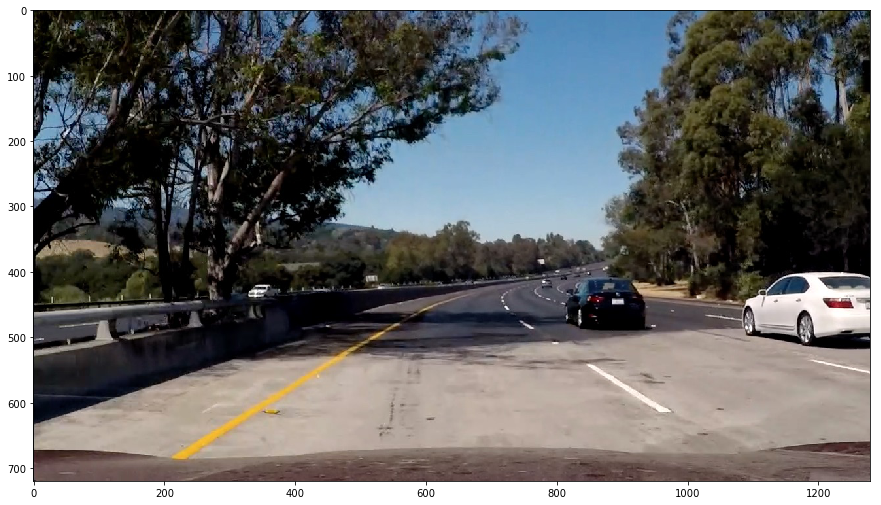

In [31]:
# let's draw an new image

img = mpimg.imread('test_images/test5.jpg')
plt.figure(figsize=(15,30))
plt.imshow(img)

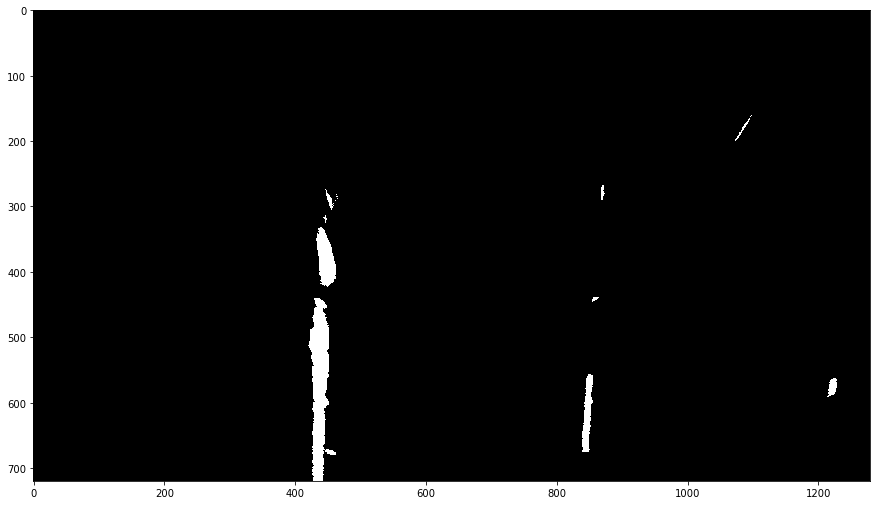

In [32]:
# let's show its cam-calibrated, perspective-warped and binary-thresholded version

img_cc_pt_thr = process_1_cc_pt_thr(img)
plt.figure(figsize=(15,30))
plt.imshow(img_cc_pt_thr, cmap='gray')

In [33]:
# let's find 2nd order curve fitting coefficients for both right and left lane , and indices also.

left_fit_coef, right_fit_coef, left_lane_inds, right_lane_inds = process_2_line_fit_prev(img_cc_pt_thr, left_fit_coef, right_fit_coef)

In [34]:
print(left_fit_coef)

[  1.26231548e-04  -1.62588350e-01   4.89171376e+02]


In [35]:
print(right_fit_coef)

[  1.95544460e-05  -8.48969225e-02   8.92385251e+02]


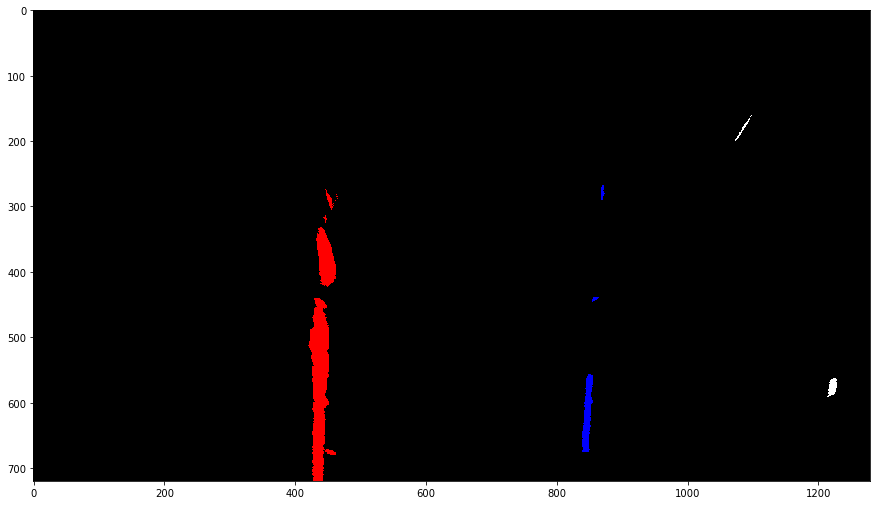

In [36]:
# let's define a 3-channel color image and mark on it left lane with red color 
# and right lane with blue color using indices found in the above function

img_out = np.uint8(np.dstack((img_cc_pt_thr, img_cc_pt_thr, img_cc_pt_thr))*255)
nonzero = img_cc_pt_thr.nonzero()
nonzero_y = np.array(nonzero[0])
nonzero_x = np.array(nonzero[1])
img_out[nonzero_y[left_lane_inds], nonzero_x[left_lane_inds]] = [255, 0, 0]
img_out[nonzero_y[right_lane_inds], nonzero_x[right_lane_inds]] = [0, 0, 255]
plt.figure(figsize=(15,30))
plt.imshow(img_out)

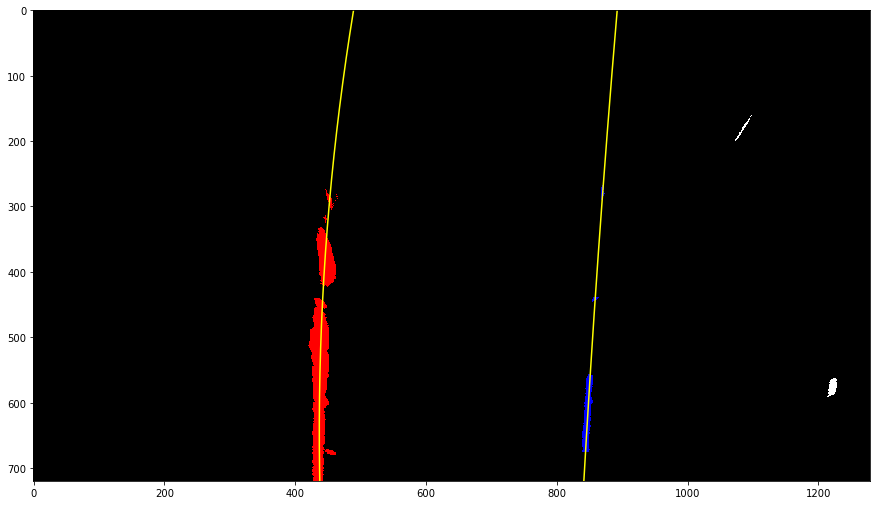

In [37]:
# let's draw lane curve, fitted using 2nd order polynomial using a yellow color

plot_y       = np.linspace(0, h-1, h )
plot_left_x  = left_fit_coef[0] * plot_y**2 + left_fit_coef[1] * plot_y + left_fit_coef[2]
plot_right_x = right_fit_coef[0]* plot_y**2 + right_fit_coef[1]* plot_y + right_fit_coef[2]
plt.figure(figsize=(15,30))
plt.imshow(img_out)
plt.plot(plot_left_x, plot_y, color='yellow')
plt.plot(plot_right_x, plot_y, color='yellow')

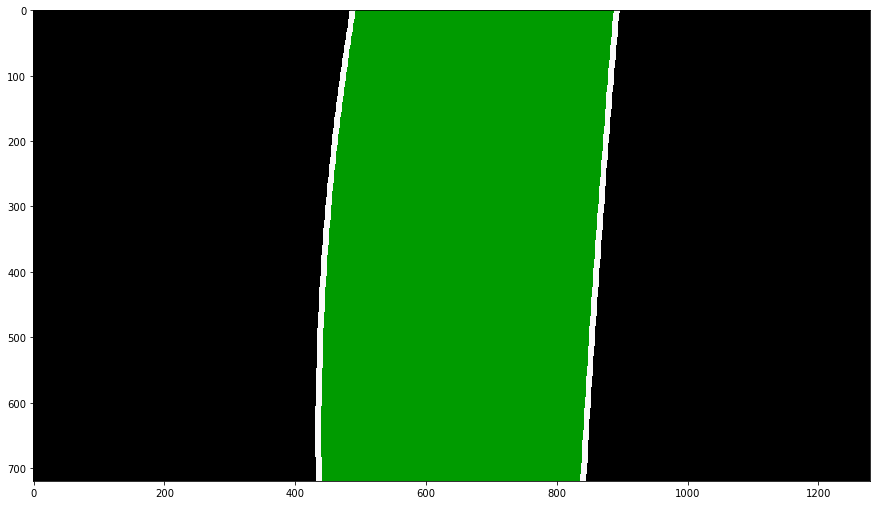

In [38]:
# let's fill the area between two yellow lane curve marked with green carpet

pts_left  = np.array([np.transpose(np.vstack([plot_left_x, plot_y]))])
pts_right = np.array([np.flipud(np.transpose(np.vstack([plot_right_x, plot_y])))])
pts       = np.hstack((pts_left, pts_right))
img_lane_pt = np.zeros_like(img_out)
cv2.fillPoly(img_lane_pt, np.int_([pts]), (0,155, 0))
cv2.polylines(img_lane_pt, np.int32([pts_left]),  isClosed=False, color=(250,250,250), thickness=7)
cv2.polylines(img_lane_pt, np.int32([pts_right]), isClosed=False, color=(250,250,250), thickness=7)
plt.figure(figsize=(15,30))
plt.imshow(img_lane_pt)

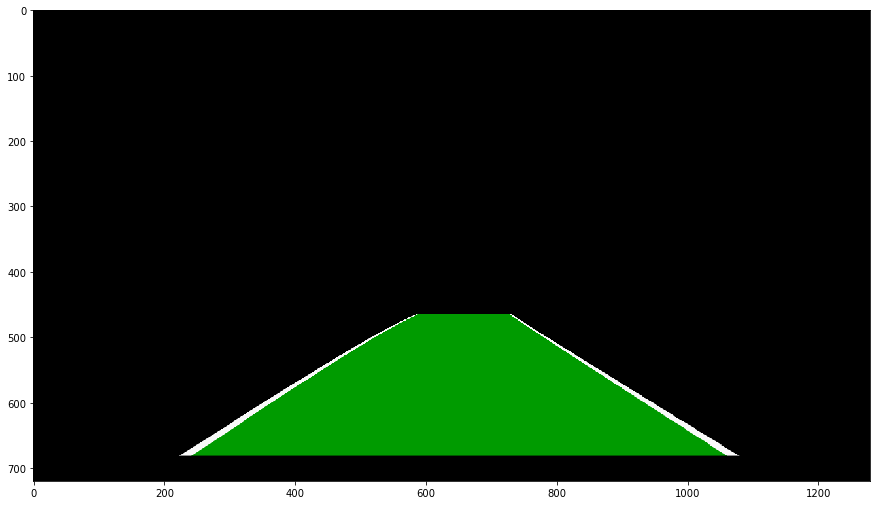

In [39]:
# let's do the inverse of perspective warping so that we can overlap and merge the green carpet on real life road image

img_lane = perspTransInverse(img_lane_pt)
plt.figure(figsize=(15,30))
plt.imshow(img_lane)

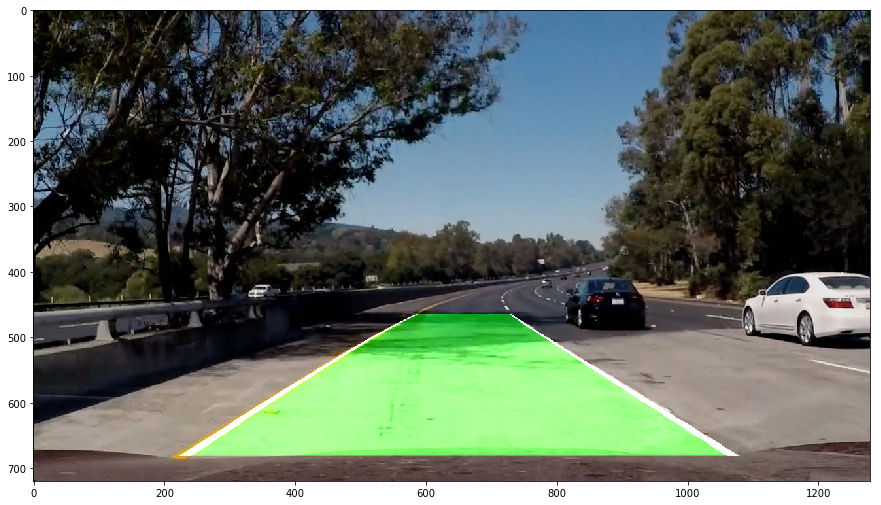

In [40]:
# lets draw green carpet on the actual road image.

alpha = 0.9
beta  = 0.9
gamma = 1
img_lane_imposed = cv2.addWeighted(img, alpha, img_lane, beta, gamma)
plt.figure(figsize=(15,30))
plt.imshow(img_lane_imposed)

In [41]:
# Define a function (process_3_*) to find the lane curvature and shift from center of the road
# this function takes as input the binary image and corresponding polynomial coefficients obtained from
# above function

def process_3_find_curvature_and_shift(bin_img, left_fit_coef, right_fit_coef, left_lane_inds, right_lane_inds):
    y_scale_meters_per_pixel = 3.048/100
    x_scale_meters_per_pixel = 3.7/378

    left_curvature  = 0
    right_curvature = 0
    shift           = 0
    
    nonzero   = bin_img.nonzero()
    nonzero_y = np.array(nonzero[0])
    nonzero_x = np.array(nonzero[1])
    
    left_x  = nonzero_x[left_lane_inds]
    left_y  = nonzero_y[left_lane_inds] 
    right_x = nonzero_x[right_lane_inds]
    right_y = nonzero_y[right_lane_inds]
    
    if len(left_x) != 0 and len(right_x) != 0:
        left_fit_coef_now  = np.polyfit(left_y  * y_scale_meters_per_pixel, left_x  * x_scale_meters_per_pixel, 2)
        right_fit_coef_now = np.polyfit(right_y * y_scale_meters_per_pixel, right_x * x_scale_meters_per_pixel, 2)
        
        left_curvature  = ((1 + (2 * left_fit_coef_now[0] * (h-1) * y_scale_meters_per_pixel + left_fit_coef_now[1]) **2)**1.5) / np.absolute(2 * left_fit_coef_now[0])
        right_curvature = ((1 + (2 * right_fit_coef_now[0]* (h-1) * y_scale_meters_per_pixel + right_fit_coef_now[1])**2)**1.5) / np.absolute(2 * right_fit_coef_now[0])

    if right_fit_coef is not None and left_fit_coef is not None:
        left_lane_base_x  = left_fit_coef[0] * h**2 + left_fit_coef[1] * h + left_fit_coef[2]
        right_lane_base_x = right_fit_coef[0]* h**2 + right_fit_coef[1]* h + right_fit_coef[2]
        lane_center_position = (right_lane_base_x + left_lane_base_x) / 2
        car_position = w/2
        shift = (car_position - lane_center_position) * x_scale_meters_per_pixel

    return left_curvature, right_curvature, shift

In [42]:
# let's find the left lane curvature and right lane curvature and shift

left_curvature, right_curvature, shift = process_3_find_curvature_and_shift(img_cc_pt_thr, left_fit_coef, right_fit_coef, left_lane_inds, right_lane_inds)
print('Radius of curvature for example:', left_curvature, 'm,', right_curvature, 'm')
print('Distance from lane center for example:', shift, 'm')

Radius of curvature for example: 375.963927992 m, 2428.06905086 m
Distance from lane center for example: 0.00517466371206 m


In [43]:
# let's define a function to draw the curvature lane on image
# this function takes as input the original image and corresponding binary thresholded image
# and returns the original image with lane carpet drawn on it

def process_4_draw_lane_on_image(img, img_bin, left_fit_coef, right_fit_coef):
    img_copy = np.copy(img)
    if left_fit_coef is None or right_fit_coef is None:
        return img

    plot_y      = np.linspace(0, h-1, h)
    left_fit_x  = left_fit_coef[0] * plot_y**2 + left_fit_coef[1] * plot_y + left_fit_coef[2]
    right_fit_x = right_fit_coef[0]* plot_y**2 + right_fit_coef[1]* plot_y + right_fit_coef[2]

    pts_left  = np.array([np.transpose(np.vstack([left_fit_x, plot_y]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fit_x, plot_y])))])
    pts       = np.hstack((pts_left, pts_right))

    img_temp = np.zeros_like(img_bin).astype(np.uint8)
    img_lane_pt = np.dstack((img_temp, img_temp, img_temp))

    cv2.fillPoly(img_lane_pt, np.int_([pts]), (0,255, 0))
    cv2.polylines(img_lane_pt, np.int32([pts_left]),  isClosed=False, color=(255,0,255), thickness=15)
    cv2.polylines(img_lane_pt, np.int32([pts_right]), isClosed=False, color=(0,255,255), thickness=15)
    alpha = 0.9
    beta  = 0.9
    gamma = 1
    img_lane = perspTransInverse(img_lane_pt)
    result = cv2.addWeighted(img_copy, alpha, img_lane, beta, gamma)
    return result

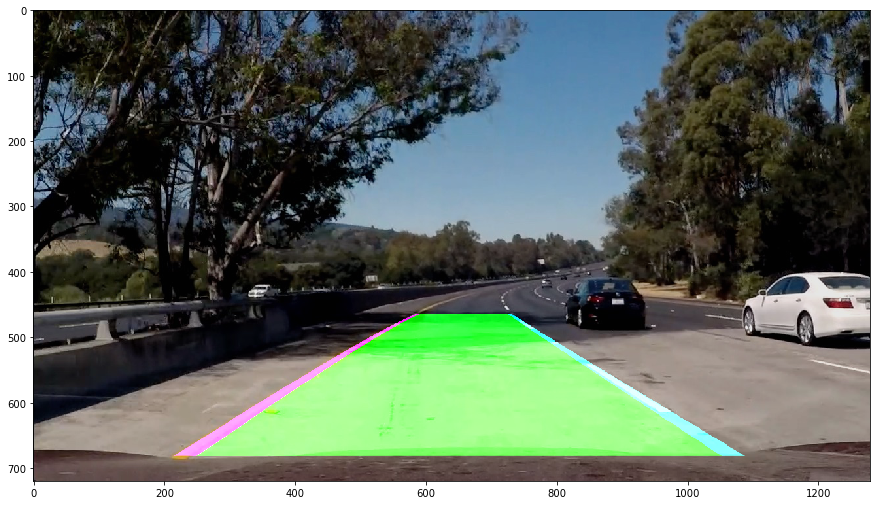

In [44]:
img_lane = process_4_draw_lane_on_image(img, img_cc_pt_thr, left_fit_coef, right_fit_coef)
plt.figure(figsize=(15,30))
plt.imshow(img_lane)

In [45]:
# this function takes as input the original image and curvature and shift and draw this information 
# on top left corner on the image

def process_5_draw_data_on_image(img, curvature, shift):
    img_copy = np.copy(img)
    cv2.putText(img_copy, 'Curveture:'+'{:04.1f}'.format(curvature)+'meters', (50,50), cv2.FONT_HERSHEY_PLAIN, 2.0, (255,255,255), 3, cv2.LINE_AA)
    direction = ''
    if shift > 0:
        direction = 'right'
    elif shift < 0:
        direction = 'left'
    abs_center_dist = abs(shift)
    cv2.putText(img_copy, '{:04.1f}'.format(abs_center_dist)+' meters '+direction+' of center', (40,120), cv2.FONT_HERSHEY_PLAIN, 2.0, (255,255,255), 3, cv2.LINE_AA)
    return img_copy

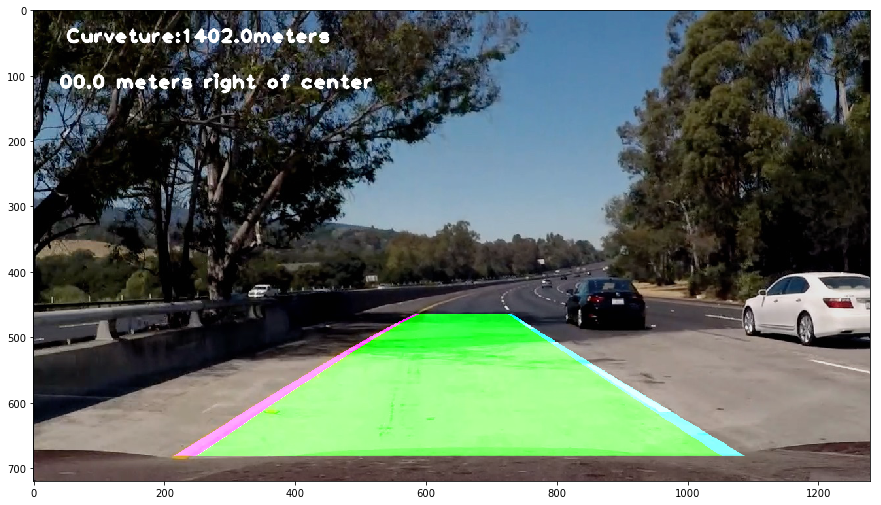

In [46]:
# let's write data on the image

img_text_info = process_5_draw_data_on_image(img_lane, (left_curvature+right_curvature)/2, shift)
plt.figure(figsize=(15,30))
plt.imshow(img_text_info)

In [48]:
# A Class (we can also use global variables, but this is smart) to remember information about, past lane detected
# flag, average curvature and shift on the road and other information

class Line():
    def __init__(self):
        self.curvature              = 500
        self.shift                  = 0.5
        self.past_frames            = 5
        self.left_prev_detected     = False
        self.right_prev_detected    = False
        self.left_avg_fit_coef      = None
        self.right_avg_fit_coef     = None
        self.left_fit_coef_history  = []
        self.right_fit_coef_history = []
        self.left_errors            = np.array([0,0,0], dtype='float')
        self.right_errors           = np.array([0,0,0], dtype='float')
    
    def avg_curvature(self, curv):
        alpha_smooth = 0.99
        self.curvature = alpha_smooth * self.curvature + (1.0-alpha_smooth) * curv
        return self.curvature

    def avg_shift(self, shift):
        alpha_smooth = 0.85
        self.shift = alpha_smooth * self.shift + (1.0-alpha_smooth) * shift
        return self.shift
        

    def save_prev_fit_coefs(self, left_fit_coef, right_fit_coef):
        if left_fit_coef is not None:
            if self.left_avg_fit_coef is not None:
                self.left_errors = abs(left_fit_coef-self.left_avg_fit_coef)
            if (self.left_errors[0] > 0.001 or self.left_errors[1] > 1.0 or self.left_errors[2] > 100.) and len(self.left_fit_coef_history) > 0:
                self.left_prev_detected = False
            else:
                self.left_prev_detected = True
                self.left_fit_coef_history.append(left_fit_coef)
                if len(self.left_fit_coef_history) > self.past_frames:
                    self.left_fit_coef_history = self.left_fit_coef_history[len(self.left_fit_coef_history)-5:]
                self.left_avg_fit_coef = np.average(self.left_fit_coef_history, axis=0)
        else:
            self.left_prev_detected = False
            if len(self.left_fit_coef_history) > 0:
                self.left_fit_coef_history = self.left_fit_coef_history[:len(self.left_fit_coef_history)-1]
            if len(self.left_fit_coef_history) > 0:
                self.left_avg_fit_coef = np.average(self.left_fit_coef_history, axis=0)

        if right_fit_coef is not None:
            if self.right_avg_fit_coef is not None:
                self.right_errors = abs(right_fit_coef-self.right_avg_fit_coef)
            if (self.right_errors[0] > 0.001 or self.right_errors[1] > 1.0 or self.right_errors[2] > 100.) and len(self.right_fit_coef_history) > 0:
                self.right_prev_detected = False
            else:
                self.right_prev_detected = True
                self.right_fit_coef_history.append(right_fit_coef)
                if len(self.right_fit_coef_history) > self.past_frames:
                    self.right_fit_coef_history = self.right_fit_coef_history[len(self.right_fit_coef_history)-5:]
                self.right_avg_fit_coef = np.average(self.right_fit_coef_history, axis=0)
        else:
            self.right_prev_detected = False
            if len(self.right_fit_coef_history) > 0:
                self.right_fit_coef_history = self.right_fit_coef_history[:len(self.right_fit_coef_history)-1]
            if len(self.right_fit_coef_history) > 0:
                self.right_avg_fit_coef = np.average(self.right_fit_coef_history, axis=0)

In [49]:
# This function is the mail processing function, this calls other function as follows
#
#              class Line
#                     | 
#                     | |->-process_2_line_fit_current->-|
#  img->process_main--#-|                                |->-process_3_find_curvature_and_shift->-process_4_draw_lane_on_image->-process_5_draw_data_on_image 
#                       |->-process_2_line_fit_prev---->-|

def process_main(img):
    img_copy = np.copy(img)
    img_cc_pt_thr = process_1_cc_pt_thr(img_copy)

    if not line.left_prev_detected or not line.right_prev_detected:
        left_fit_coef, right_fit_coef, left_lane_inds, right_lane_inds = process_2_line_fit_current(img_cc_pt_thr)
    else:
        left_fit_coef, right_fit_coef, left_lane_inds, right_lane_inds = process_2_line_fit_prev(img_cc_pt_thr, line.left_avg_fit_coef, line.right_avg_fit_coef)
        
    line.save_prev_fit_coefs(left_fit_coef, right_fit_coef)

    if line.left_avg_fit_coef is not None and line.right_avg_fit_coef is not None:
        left_curvature, right_curvature, shift = process_3_find_curvature_and_shift(img_cc_pt_thr, left_fit_coef, right_fit_coef, left_lane_inds, right_lane_inds)
        curv_avg = line.avg_curvature(0.5 * left_curvature + 0.5 * right_curvature)
        shift_avg = line.avg_shift(shift)
        img_out_temp = process_4_draw_lane_on_image(img_copy, img_cc_pt_thr, left_fit_coef, right_fit_coef)
        img_out = process_5_draw_data_on_image(img_out_temp, curv_avg, shift_avg)
    else:
        img_out = img_copy
    
    return img_out

In [56]:
# let's process project video

line = Line()
video_input1 = VideoFileClip('project_video.mp4')
processed_video = video_input1.fl_image(process_main)
processed_video.write_videofile('project_video_out.mp4', audio=False)

[MoviePy] >>>> Building video project_video_out.mp4
[MoviePy] Writing video project_video_out.mp4


100%|█████████▉| 1260/1261 [02:43<00:00,  7.75it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_out.mp4 



In [57]:
%%HTML
<video width="640" height="480" controls>
  <source src="project_video_out.mp4" type="video/mp4">
</video>

In [58]:
# let's process challenge video

line = Line()
video_input1 = VideoFileClip('challenge_video.mp4')
processed_video = video_input1.fl_image(process_main)
processed_video.write_videofile('challenge_video_out.mp4', audio=False)

[MoviePy] >>>> Building video challenge_video_out.mp4
[MoviePy] Writing video challenge_video_out.mp4


100%|██████████| 485/485 [00:52<00:00,  8.70it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_video_out.mp4 



In [59]:
%%HTML
<video width="640" height="480" controls>
  <source src="challenge_video_out.mp4" type="video/mp4">
</video>

In [60]:
# let's process harder_challenge video

line = Line()
video_input1 = VideoFileClip('harder_challenge_video.mp4')
processed_video = video_input1.fl_image(process_main)
processed_video.write_videofile('harder_challenge_video_out.mp4', audio=False)

[MoviePy] >>>> Building video harder_challenge_video_out.mp4
[MoviePy] Writing video harder_challenge_video_out.mp4


100%|█████████▉| 1199/1200 [02:50<00:00,  7.15it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: harder_challenge_video_out.mp4 



In [61]:
%%HTML
<video width="640" height="480" controls>
  <source src="harder_challenge_video_out.mp4" type="video/mp4">
</video>